<a href="https://colab.research.google.com/github/ryangprince/TensorFlow-Bootcamp/blob/main/04_transfer_learning_in_tensorflow_part_1_feature_extraction.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

What is transfer learning?

Example transfer learning use cases:

* Computer vision ([ImageNet](https://www.image-net.org/))
* Natual language processing

Why use transfer learning?

* Can leverage an existing neural network architecture *proven to work* on problems similar to our own.
* Can leverage a working network architecture which has *already learned patterns* on similar data to our own (often results in great results with less data).

What we're going to cover (broardly):

* Introduce *transfer learning* with TensorFlow
* Using a small dataset to experiment faster (10% of training samples)
* Building a *transfer leraning feature extraction* model with TensorFlow Hub
* Use TensorBoard to track modelling experiments and results


# Transfer Learning with TensorFlow Part 1: Feature Extraction

Transfer learning is leveraging a working model's existing architecture and learned patterns for our own problem.

There are two main benefits:
1. Can lever an existing neural entwork architecture proven to work on problems similar to our own.
2. Can leverage a working neural network architecture which has already learned patterns on similar data to our own, then we can adapt those patterns to our own data.

In [ ]:
# Are we using a GPU
!nvidia-smi

Tue Feb 25 03:12:59 2025       
+-----------------------------------------------------------------------------------------+
| NVIDIA-SMI 550.54.15              Driver Version: 550.54.15      CUDA Version: 12.4     |
|-----------------------------------------+------------------------+----------------------+
| GPU  Name                 Persistence-M | Bus-Id          Disp.A | Volatile Uncorr. ECC |
| Fan  Temp   Perf          Pwr:Usage/Cap |           Memory-Usage | GPU-Util  Compute M. |
|                                         |                        |               MIG M. |
|=========================================+========================+======================|
|   0  Tesla T4                       Off |   00000000:00:04.0 Off |                    0 |
| N/A   38C    P8              9W /   70W |       0MiB /  15360MiB |      0%      Default |
|                                         |                        |                  N/A |
+-----------------------------------------+-----

## Downloading and becoming one with the data

In [ ]:
# Get data (10% of 10 food classes from Food101)
import zipfile

# Download the data
!wget https://storage.googleapis.com/ztm_tf_course/food_vision/10_food_classes_10_percent.zip

# Unzip the downloaded file
zip_ref = zipfile.ZipFile('10_food_classes_10_percent.zip')
zip_ref.extractall()
zip_ref.close()

--2025-02-25 03:13:06--  https://storage.googleapis.com/ztm_tf_course/food_vision/10_food_classes_10_percent.zip
Resolving storage.googleapis.com (storage.googleapis.com)... 173.194.215.207, 108.177.12.207, 173.194.217.207, ...
Connecting to storage.googleapis.com (storage.googleapis.com)|173.194.215.207|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 168546183 (161M) [application/zip]
Saving to: ‘10_food_classes_10_percent.zip’

10_food_classes_10_ 100%[===================>] 160.74M   135MB/s    in 1.2s    

2025-02-25 03:13:07 (135 MB/s) - ‘10_food_classes_10_percent.zip’ saved [168546183/168546183]



In [ ]:
# How many images in each folder?
import os

# Walk through 10 percent data directory and list number of files
for dirpath, dirnames, filenames in os.walk('10_food_classes_10_percent'):
  print(f"There are {len(dirnames)} directories and {len(filenames)} images in '{dirpath}")

There are 2 directories and 0 images in '10_food_classes_10_percent
There are 10 directories and 0 images in '10_food_classes_10_percent/test
There are 0 directories and 250 images in '10_food_classes_10_percent/test/ramen
There are 0 directories and 250 images in '10_food_classes_10_percent/test/pizza
There are 0 directories and 250 images in '10_food_classes_10_percent/test/chicken_curry
There are 0 directories and 250 images in '10_food_classes_10_percent/test/hamburger
There are 0 directories and 250 images in '10_food_classes_10_percent/test/grilled_salmon
There are 0 directories and 250 images in '10_food_classes_10_percent/test/steak
There are 0 directories and 250 images in '10_food_classes_10_percent/test/ice_cream
There are 0 directories and 250 images in '10_food_classes_10_percent/test/chicken_wings
There are 0 directories and 250 images in '10_food_classes_10_percent/test/sushi
There are 0 directories and 250 images in '10_food_classes_10_percent/test/fried_rice
There are 

Notice above how there are the same number of test examples but fewer training examples...

In [ ]:
# Set up train and test directories
train_dir = '10_food_classes_10_percent/train/'
test_dir = '10_food_classes_10_percent/test/'

In [ ]:
# Get class names
import pathlib
import numpy as np

data_dir = pathlib.Path(train_dir)
class_names = np.array(sorted([item.name for item in data_dir.glob('*')]))
class_names

array(['chicken_curry', 'chicken_wings', 'fried_rice', 'grilled_salmon',
       'hamburger', 'ice_cream', 'pizza', 'ramen', 'steak', 'sushi'],
      dtype='<U14')

In [ ]:
# Define a function to visualize a single random image and it's class name
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
import random

def view_random_image(target_dir, target_class):
  # Set up target directory
  target_folder = target_dir + '/' + target_class

  # Get a random image path (to go target folder and randomly select 1 image)
  random_image = random.sample(os.listdir(target_folder), 1)
  print(random_image)

  # Read in and plot the image
  img = mpimg.imread(target_folder + '/' + random_image[0])
  plt.imshow(img)
  plt.title(target_class)
  plt.axis('off');

  print(f"Image shape: {img.shape}")

  # return img

['133637.jpg']
Image shape: (384, 512, 3)


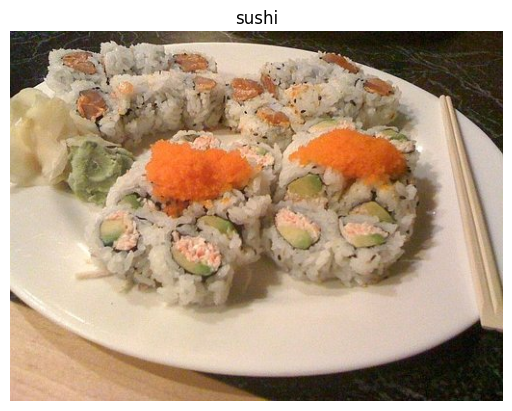

In [ ]:
# View a random image
view_random_image(target_dir=train_dir,
                  target_class=random.choice(class_names))

## Create data loaders (preparing the data)

We'll use the `ImageDataGenerator` class to load our images in batches.

In [ ]:
# Setup data inputs
from tensorflow.keras.preprocessing.image import ImageDataGenerator

# If you ever see variables as all capitals in a deep learning notebook, that's probably because they're hyperparameters
IMAGE_SHAPE = (224, 224)
BATCH_SIZE = 32

train_datagen = ImageDataGenerator(rescale=1/255.)
test_datagen = ImageDataGenerator(rescale=1/255.)

print('Training imges:')
train_data_10_percent = train_datagen.flow_from_directory(train_dir,
                                                          target_size=IMAGE_SHAPE,
                                                          batch_size=BATCH_SIZE,
                                                          class_mode='categorical')

print('Testing images:')
test_data = test_datagen.flow_from_directory(test_dir,
                                             target_size=IMAGE_SHAPE,
                                             batch_size=BATCH_SIZE,
                                             class_mode='categorical')

Training imges:
Found 750 images belonging to 10 classes.
Testing images:
Found 2500 images belonging to 10 classes.


## Setting up callbacks (things to run whilst our model trains)

Callbacks are extra functionality you can add to your models to be performed during or after training. Some of the most popular callbacks:

* Tracking experiments with the TensorBoard callback
* Model checkpoint with the ModelCheckpoint callback
* Stopping a model from training (before it trains for too long and overfits) with the EarlyStopping callback

In [ ]:
# Create TensorBoard callback (functionized because we need to create a new one for each model)
import datetime

def create_tensorboard_callback(dir_name, experiment_name):
  log_dir = dir_name + '/' + experiment_name + '/' + datetime.datetime.now().strftime('%Y%m%d-%H%M%S')
  tensorboard_callback = keras.callbacks.TensorBoard(log_dir=log_dir) # updated 'tf.keras.callbacks' to 'keras.callbacks' to align with older version of Keras being used
  print(f"Saving TensorBoard log files to: {log_dir}")
  return tensorboard_callback

🔑 **Note:** You can customize the directory where your TensorBoard logs (model training metrics) get saved to whatever you like. The `log_dir` parameter we've created above is only one option.

## Creating models using Kaggle (formerl TensorFlow Hub)

In the past we've used TensorFlow to create our own models layer by layer from scratch.

Now we're going to do a similar process, except the majority of our model's layers are going to come from Kaggle Models (TensorFlow Hub no longer hosts models).

We can access pretrained models on: https://www.kaggle.com/models (formerly https://tfhub.dev/)

Browsing the Kaggle (formerly TensorFlow Hub) page and sorting for image classification, we found the following feature vector model links:
* imagenet: https://www.kaggle.com/models/google/resnet-v2/tensorFlow2/50-feature-vector/2?tfhub-redirect=true
* efficientnet: https://www.kaggle.com/models/tensorflow/efficientnet/tensorFlow2/b0-feature-vector

**Resources:**

* [Papers with Code](https://paperswithcode.com/): Let's you sort through and select pre-trained models and tells you which architecture is performing best in your given problem domain.

In [ ]:
# Let's compare the following two models
resnet_url = "https://www.kaggle.com/models/google/resnet-v2/TensorFlow2/50-feature-vector/2"

efficientnet_url = "https://www.kaggle.com/models/tensorflow/efficientnet/TensorFlow2/b0-feature-vector/1"

Although TensorFlow Hub is no longer a place where models are hosted, the `tensorflow_hub` library appears to still be used to get the models from Kaggle. I will follow along and provide updated code if anything stops working.

### IGNORE: Upload Kaggle model

In [ ]:
 # Can ignore for now
 # Upload kaggle.json to drive
 from google.colab import files
 files.upload()

Saving kaggle.json to kaggle.json


{'kaggle.json': b'{"username":"ryanprince123","key":"405bc12f9b590389bedae7e9cd6149ac"}'}

In [ ]:
# Can ignore for now
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


Trying to use the code for this module does not work if using the latest version of Keras (Keras 3) that comes when you import the latest version of TensorFlow (version 2.18.0).

To resolve this, specifically run `import tf_keras as keras`. This allows you to use the legacy Keras 2 package that is still being maintained and is available as `tf_keras` on PyPI.

If you can't import `tf_keras` initially, then you can run `!pip install tf_keras` and then run `import tf_keras as keras`.

Link to the Keras site with more information: https://keras.io/getting_started/#tensorflow--keras-2-backwards-compatibility

In [ ]:
# Import dependencies
import tensorflow as tf
import tensorflow_hub as hub
import tf_keras as keras

In [ ]:
# Check the version of tensorflow_hub
tf.__version__, hub.__version__, keras.__version__

('2.18.0', '0.16.1', '2.18.0')

In [ ]:
# Let's make a create_model() function to create a model from a URL
def create_model(model_url, num_classes=10):
  """
  Takes a TensorFlow Hub URL and creates a Keras Sequential model with it.

  Args:
    model_url (str): A Kaggle feature extraction URL.
    num_classes (int): Number of ouptut neurons in the output layer,
    should be equal to number of target classes, default 10.

  Returns:
    An uncompiled Keras Sequential model with model_url as feature extractor
    layer and Dense output layer with num_classes output neurons.
  """
  # Download the pretrained model and save it as a Keras layer (doesn't work in Keras 3)
  feature_extractor_layer = hub.KerasLayer(model_url,
                                           trainable=False, # freeze the already learned patterns
                                           name='feature_extraction_layer',
                                           input_shape=IMAGE_SHAPE+(3,)) # fancy way of updating IMAGE_SHAPE from (224, 224) to (224, 224, 3)

  # Create our own model
  model = keras.Sequential([
      feature_extractor_layer,
      keras.layers.Dense(num_classes, activation='softmax', name='output_layer')
    ])

  return model

The code in the video wasn't working so used ChatGPT o3-mini-high model to create a modified function. Let's see if it works 🤷

### Creating and testing ResNet Kaggle (TensorFlow Hub) Feature Extraction model

In [ ]:
# Create ResNet model
resnet_model = create_model(model_url=resnet_url,
                              num_classes=train_data_10_percent.num_classes) # the .num_classes method returns the number of classes in the dataset

In [ ]:
# Get a summary of the model
resnet_model.summary()

Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 feature_extraction_layer (  (None, 2048)              23564800  
 KerasLayer)                                                     
                                                                 
 output_layer (Dense)        (None, 10)                20490     
                                                                 
Total params: 23585290 (89.97 MB)
Trainable params: 20490 (80.04 KB)
Non-trainable params: 23564800 (89.89 MB)
_________________________________________________________________


In [ ]:
# Compile our resnet model
resnet_model.compile(loss='categorical_crossentropy',
                     optimizer=keras.optimizers.Adam(), # using 'keras' instead of 'tf.keras' because using 'tf_keras' to fix earlier issue initializing model
                     metrics=['accuracy'])

In [ ]:
# Fit the model
resnet_history = resnet_model.fit(train_data_10_percent,
                                  epochs=5,
                                  steps_per_epoch=len(train_data_10_percent),
                                  validation_data=test_data,
                                  validation_steps=len(test_data),
                                  callbacks=[create_tensorboard_callback(dir_name='tensorflow_hub',
                                                                         experiment_name='resnet50V2')])

Saving TensorBoard log files to: tensorflow_hub/resnet50V2/20250224-231834
Epoch 1/5
24/24 [==============================] - 29s 607ms/step - loss: 2.0438 - accuracy: 0.3107 - val_loss: 1.2577 - val_accuracy: 0.5976
Epoch 2/5
24/24 [==============================] - 12s 538ms/step - loss: 0.9427 - accuracy: 0.7227 - val_loss: 0.8670 - val_accuracy: 0.7316
Epoch 3/5
24/24 [==============================] - 11s 463ms/step - loss: 0.6312 - accuracy: 0.8240 - val_loss: 0.7402 - val_accuracy: 0.7652
Epoch 4/5
24/24 [==============================] - 12s 533ms/step - loss: 0.4816 - accuracy: 0.8867 - val_loss: 0.7165 - val_accuracy: 0.7648
Epoch 5/5
24/24 [==============================] - 12s 533ms/step - loss: 0.3813 - accuracy: 0.9133 - val_loss: 0.6702 - val_accuracy: 0.7856


In module 3 (CNNs and Computer Vision) our final model (model_10) only had a training accuracy of 44% and validation accuracy of 40%:
* accuracy: 0.4360 - loss: 1.6574 - val_accuracy: 0.4040 - val_loss: 1.7662

Now, using transfer learning, we have a training accuracy of 92% and a validation of accuracy of 77%! And we did it with only 10% of the training data!
* loss: 0.3889 - accuracy: 0.9213 - val_loss: 0.6871 - val_accuracy: 0.7696

Wow!

That. Is. Incredible. Our transfer learning feature extractor model out performed ALL of the previous models we built by hand... (substantially) and in a quicker time AND with only 10% of the trianing examples.

In [ ]:
# Quick view of resnet_history
resnet_history.history

{'loss': [2.0437633991241455,
  0.9427363276481628,
  0.6311922073364258,
  0.4816037714481354,
  0.38128119707107544],
 'accuracy': [0.31066668033599854,
  0.7226666808128357,
  0.8240000009536743,
  0.8866666555404663,
  0.9133333563804626],
 'val_loss': [1.2577204704284668,
  0.8669673800468445,
  0.7402099370956421,
  0.7165055871009827,
  0.670211672782898],
 'val_accuracy': [0.597599983215332,
  0.7315999865531921,
  0.7652000188827515,
  0.7648000121116638,
  0.7856000065803528]}

In [ ]:
# Let's create a function to plot our loss curves...
def plot_loss_curves(history):
  """
  Returns separate loss curves for training and validation metrics.

  Args:
    history: TensorFlow history object.

  Returns:
    Plots of training and validation loss and accuracy.
  """
  loss = history.history['loss']
  val_loss = history.history['val_loss']

  accuracy = history.history['accuracy']
  val_accuracy = history.history['val_accuracy']

  epochs = range(len(history.history['loss']))

  # Plot loss
  plt.plot(epochs, loss, label='training_loss')
  plt.plot(epochs, val_loss, label='val_loss')
  plt.title('Loss')
  plt.xlabel('Epochs')
  plt.legend()

  # Plot accuracy
  plt.figure()
  plt.plot(epochs, accuracy, label='training_accuracy')
  plt.plot(epochs, val_accuracy, label='val_accuracy')
  plt.title('Accuracy')
  plt.xlabel('Epochs')
  plt.legend()

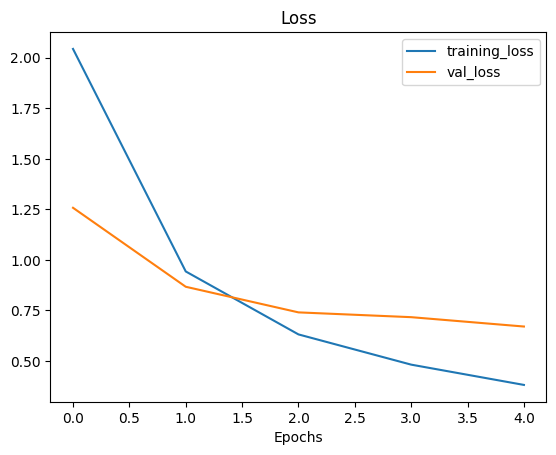

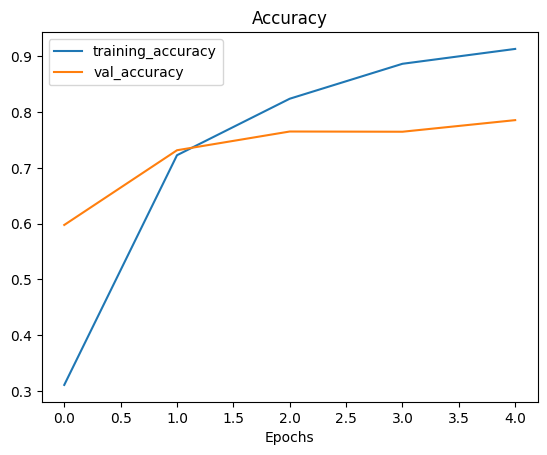

In [ ]:
# Plot loss and accuracy curves
plot_loss_curves(resnet_history)

### Creating and testing EfficientNetB0 Kaggle (formerly TensorFlow Hub) Feature Extraction model

https://research.google/blog/efficientnet-improving-accuracy-and-efficiency-through-automl-and-model-scaling/

In [ ]:
# Create EfficientNetB0 Feature Extraction model
efficientnet_model = create_model(model_url=efficientnet_url,
                                  num_classes=train_data_10_percent.num_classes)

# Compile EfficientNet model
efficientnet_model.compile(loss='categorical_crossentropy',
                           optimizer=keras.optimizers.Adam(),
                           metrics=['accuracy'])

# Fit EfficientNet model to 10% of training data
efficientnet_history = efficientnet_model.fit(train_data_10_percent,
                                             epochs=5,
                                             steps_per_epoch=len(train_data_10_percent),
                                             validation_data=test_data,
                                             validation_steps=len(test_data),
                                             callbacks=[create_tensorboard_callback(dir_name='tensorflow_hub',
                                                                                    experiment_name='efficientnetb0')])

Saving TensorBoard log files to: tensorflow_hub/efficientnetb0/20250224-232045
Epoch 1/5
24/24 [==============================] - 23s 510ms/step - loss: 1.8450 - accuracy: 0.4600 - val_loss: 1.3101 - val_accuracy: 0.7280
Epoch 2/5
24/24 [==============================] - 12s 527ms/step - loss: 1.0964 - accuracy: 0.7627 - val_loss: 0.8581 - val_accuracy: 0.8256
Epoch 3/5
24/24 [==============================] - 12s 509ms/step - loss: 0.7790 - accuracy: 0.8347 - val_loss: 0.6903 - val_accuracy: 0.8484
Epoch 4/5
24/24 [==============================] - 10s 416ms/step - loss: 0.5996 - accuracy: 0.8627 - val_loss: 0.6096 - val_accuracy: 0.8568
Epoch 5/5
24/24 [==============================] - 12s 507ms/step - loss: 0.5256 - accuracy: 0.8813 - val_loss: 0.5623 - val_accuracy: 0.8660


Validation accuracy is already 86% with only 10% of the training data, and training accruracy is 89%!

Side-by-side with our ResNet model:
* resnet_model: loss: 0.3889 - accuracy: 0.9213 - val_loss: 0.6871 - val_accuracy: 0.7696
* efficientnet_model: loss: 0.4909 - accuracy: 0.8907 - val_loss: 0.5555 - val_accuracy: 0.8580

AND training time was only around 9 - 12 seconds!

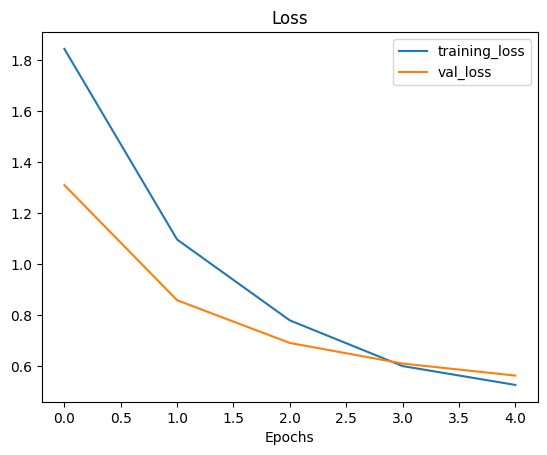

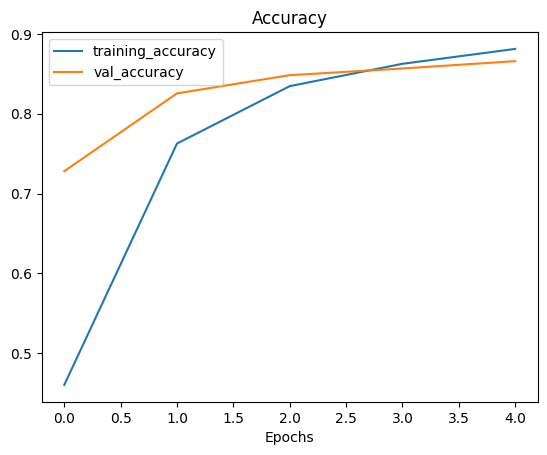

In [ ]:
# Plot the loss curves
plot_loss_curves(efficientnet_history)

In [ ]:
efficientnet_model.summary()

Model: "sequential_1"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 feature_extraction_layer (  (None, 1280)              4049564   
 KerasLayer)                                                     
                                                                 
 output_layer (Dense)        (None, 10)                12810     
                                                                 
Total params: 4062374 (15.50 MB)
Trainable params: 12810 (50.04 KB)
Non-trainable params: 4049564 (15.45 MB)
_________________________________________________________________


In [ ]:
resnet_model.summary()

Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 feature_extraction_layer (  (None, 2048)              23564800  
 KerasLayer)                                                     
                                                                 
 output_layer (Dense)        (None, 10)                20490     
                                                                 
Total params: 23585290 (89.97 MB)
Trainable params: 20490 (80.04 KB)
Non-trainable params: 23564800 (89.89 MB)
_________________________________________________________________


Notice how the ResNet model has over 23 million untrainable parameters, but EfficientNet has only just over 4 million, and yet it outperformed ResNet on the validation data...

In [ ]:
# How many layers does our efficientnetb0 feature extractor have?
len(efficientnet_model.layers[0].weights)

309

## Different types of transfer learning

* **"As is" transfer learning** - using an existing model with no changes whatsoever. (e.g. using ImageNet model on 1000 ImageNet classes, none of your own).
* **"Feature extraction" transfer learning** - use the prelearned patterns of an existing model (e.g. EfficientNetB0 trained on ImageNet) and adjust the output layer for your own problem (e.g. 1000 classes -> 10 classes of food).
* **"Fine-tuning" transfer learning** - use the prelearned patterns of an existing model and "fine-tune" many or all of the underlying layers (including new output layers).

**Summary:** With **"as is" transfer learning** no changes are made to the model, you simply use it to make predictions on your data. However, to make it more specific to your problem domain, you might use **"feature extraction" transfer learning**, whereby you *freeze* the layers and make no changes, all you do is change the output layer and then train it on some of your own data. Then, finally, there is **"fine-tuning" transfer learning**, where you keep some some layers frozen, but then you *unfreeze* some or all of the layers, change the output layer, and then train on your own data (requires more data than "feature extraction").

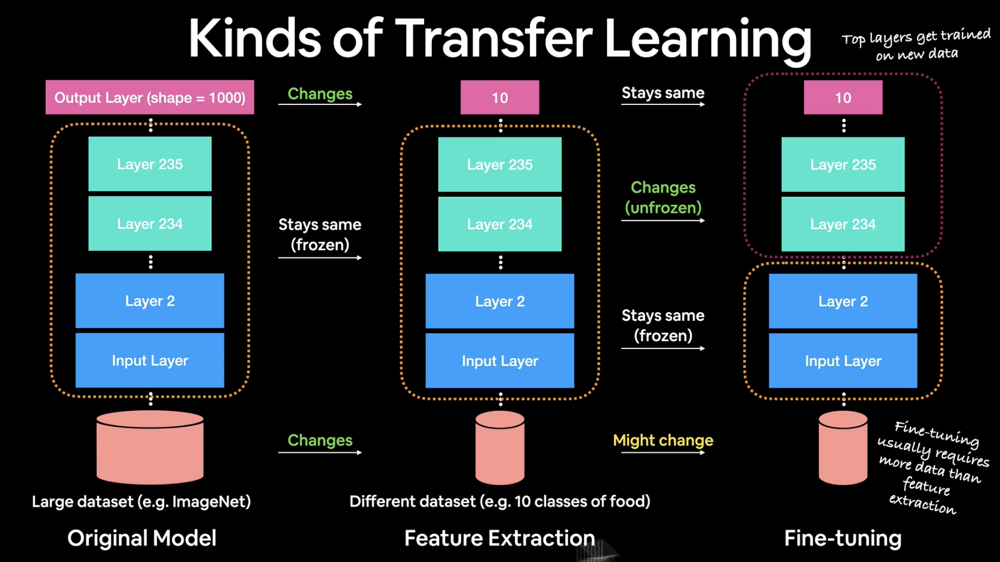

## Comparing our models results using TensorBoard

TensorBoard is a way to visually explore your machine learning models performance and intervals.

You can also track and share your machine learning experiments on TensorBoard.dev, and it integrates with websites like [Weights & Biases](https://wandb.ai/site/) too!

🔑 **Note:** When you upload things to TensorBoard your experiments are public. So if you're running private experiments (things you don't want others to see) do not upload them to TensorBoard.

In [ ]:
# Load the TensorBoard extension
%load_ext tensorboard

In [ ]:
%tensorboard --logdir=tensorflow_hub --window_title="EfficientNetB0 vs. ResNet50V2"

<IPython.core.display.Javascript object>

## Exercises & Extra-curriculum

**Exercises**
1. Build and fit a model using the same data we have here but with the MobileNetV2 architecture feature extraction (`mobilenet_v2_100_224/feature_vector`) from TensorFlow Hub, how does it perform compared to our other models?
2. Name 3 different image classification models on TensorFlow Hub that we haven't used.
3. What is the current best performing model on ImageNet?
 * Hint: you might want to check [sotabench.com](https://www.sotabench.com/) for this.

**Extra-curriculum**
* Integrate Weights & Biases for experiment tracking.
* Watch videos on fine-tuning (try checking Weights & Biases).
* Integrate [Weights & Biases](https://wandb.ai/site) with your TensorFlow models.

### Build and train model using mobilenet_v2_100_224 feature vector

In [ ]:
# Import dependencies
import tensorflow as tf
import tf_keras as keras

In [ ]:
# Mobilenet URL
mobilenet_url = "https://kaggle.com/models/google/mobilenet-v2/TensorFlow2/100-224-feature-vector/1"

In [ ]:
# Create MobileNet model
mobilenet_model = create_model(model_url=mobilenet_url,
                              num_classes=train_data_10_percent.num_classes) # the .num_classes method returns the number of classes in the dataset

In [ ]:
# View model summary
mobilenet_model.summary()

Model: "sequential_2"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 feature_extraction_layer (  (None, 1280)              2257984   
 KerasLayer)                                                     
                                                                 
 output_layer (Dense)        (None, 10)                12810     
                                                                 
Total params: 2270794 (8.66 MB)
Trainable params: 12810 (50.04 KB)
Non-trainable params: 2257984 (8.61 MB)
_________________________________________________________________


In [ ]:
# Compile the model
mobilenet_model.compile(loss='categorical_crossentropy',
                        optimizer=keras.optimizers.Adam(),
                        metrics=['accuracy'])

In [ ]:
# Fit the model
mobilenet_history = mobilenet_model.fit(train_data_10_percent,
                                        epochs=5,
                                        steps_per_epoch=len(train_data_10_percent),
                                        validation_data=test_data,
                                        validation_steps=len(test_data),
                                        callbacks=[create_tensorboard_callback(dir_name='tensorflow_hub',
                                                                               experiment_name='mobilenetV2')])

Saving TensorBoard log files to: tensorflow_hub/mobilenetV2/20250225-002915
Epoch 1/5
24/24 [==============================] - 18s 598ms/step - loss: 1.9206 - accuracy: 0.3493 - val_loss: 1.2783 - val_accuracy: 0.6244
Epoch 2/5
24/24 [==============================] - 13s 550ms/step - loss: 1.0027 - accuracy: 0.7240 - val_loss: 0.8685 - val_accuracy: 0.7588
Epoch 3/5
24/24 [==============================] - 10s 411ms/step - loss: 0.7068 - accuracy: 0.8040 - val_loss: 0.7514 - val_accuracy: 0.7840
Epoch 4/5
24/24 [==============================] - 9s 401ms/step - loss: 0.5878 - accuracy: 0.8320 - val_loss: 0.6890 - val_accuracy: 0.7908
Epoch 5/5
24/24 [==============================] - 12s 501ms/step - loss: 0.4743 - accuracy: 0.8773 - val_loss: 0.6344 - val_accuracy: 0.8072


Comparing the **mobilenet_model** compared to **resnet_model** and **efficientnet_model**:
* **resnet_model**: loss: 0.3889 - accuracy: 0.9213 - val_loss: 0.6871 - val_accuracy: 0.7696
* **efficientnet_model**: loss: 0.4909 - accuracy: 0.8907 - val_loss: 0.5555 - val_accuracy: 0.8580
* **mobilenet_model**: loss: 0.4743 - accuracy: 0.8773 - val_loss: 0.6344 - val_accuracy: 0.8072



While mobilenet_model did not perform as well as efficientnet_model, it did have a higher validation accuracy than the resnet_model, although it's training accuracy was not as high, but still 88% which is just under the efficientnet_model training accuracy of 89%.

### Integrate Weights & Biases with your TensorFlow models

In [ ]:
# Install wandb (Weights & Biases)... looks like it's already be available in Colab
!pip install wandb

In [ ]:
# Import wandb and WandCallback
import wandb
from wandb.integration.keras import WandbMetricsLogger, WandbModelCheckpoint

In [ ]:
# Login to Weights & Biases
!wandb login 33573a0e214d151edc655578616fb849b5b3de8f

wandb: Appending key for api.wandb.ai to your netrc file: /root/.netrc
wandb: W&B API key is configured. Use `wandb login --relogin` to force relogin


In [ ]:
# Initialize Weights & Biases
wandb.init(
    # set the wandb project where this run will be logged
    project='second_test',

    # track hyperparameters and run metadata with wandb.config
    config={
        "optimizer": keras.optimizers.Adam(),
        "loss": "categorical_crossentropy",
        "metric": "accuracy",
        "epoch": 5
    }
)

config = wandb.config

wandb: Currently logged in as: rpprince18 (rpprince18-personal-project) to https://api.wandb.ai. Use `wandb login --relogin` to force relogin
wandb: Using wandb-core as the SDK backend.  Please refer to https://wandb.me/wandb-core for more information.


In [ ]:
# Recreate the models trained using the feature vectors (ResNet, EfficientNet, MobileNet) with Weights & Biases callbacks

# Create the ResNet model
resnet_wandb_model = create_model(model_url=resnet_url,
                                  num_classes=train_data_10_percent.num_classes)

# Compile the model
resnet_wandb_model.compile(loss=config.loss,
                           optimizer=config.optimizer,
                           metrics=[config.metric])

# Fit the model
resnet_wandb_history = resnet_wandb_model.fit(train_data_10_percent,
                                              epochs=config.epoch,
                                              steps_per_epoch=len(train_data_10_percent),
                                              validation_data=test_data,
                                              validation_steps=len(test_data),
                                              callbacks=[WandbMetricsLogger(log_freq="epoch"),
                                                         WandbModelCheckpoint("models")])

# [optional] finish the wandb run, necessary in notebooks
wandb.finish()